<a href="https://colab.research.google.com/github/TheVailen/frameworks-lab3-images-video/blob/main/lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Лабораторная работа №3

# Импорты

In [59]:
!pip install torchmetrics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 49.7 MB/s eta 0:00:00


In [6]:
import os
import json
import math
import random
from pathlib import Path
from collections import defaultdict

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torchvision

from torch.utils.data import Dataset, DataLoader
from PIL import Image

from tqdm import tqdm

random.seed(42)
np.random.seed(42)

plt.rcParams["figure.figsize"] = (12, 7)
plt.rcParams["image.cmap"] = "gray"

print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

torch: 2.10.0+cu128
torchvision: 0.25.0+cu128
device: cuda


In [7]:
PROJECT_DIR = Path.cwd()

print("Рабочая директория:", PROJECT_DIR)
print("\nФайлы в рабочей директории:")

for path in sorted(PROJECT_DIR.iterdir()):
    print("-", path.name)


INPUT_VIDEO_PATH = PROJECT_DIR / "input.mp4"
OUTPUT_VIDEO_PATH = PROJECT_DIR / "output.mp4"
ORIG_ANN_PATH = PROJECT_DIR / "annotations.xml"

print("INPUT_VIDEO_PATH:", INPUT_VIDEO_PATH)
print("OUTPUT_VIDEO_PATH:", OUTPUT_VIDEO_PATH)
print("ORIG_ANN_PATH:", ORIG_ANN_PATH)

Рабочая директория: /content

Файлы в рабочей директории:
- .config
- annotations.xml
- input.mp4
- output.mp4
- sample_data
INPUT_VIDEO_PATH: /content/input.mp4
OUTPUT_VIDEO_PATH: /content/output.mp4
ORIG_ANN_PATH: /content/annotations.xml


## Считываем основные свойства видео

In [8]:
def get_video_info(video_path):
    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        raise ValueError(f"Не удалось открыть видео: {video_path}")

    info = {
        "path": str(video_path),
        "fps": cap.get(cv2.CAP_PROP_FPS),
        "frame_count": int(cap.get(cv2.CAP_PROP_FRAME_COUNT)),
        "width": int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
        "height": int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)),
        "duration_sec": cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS)
        if cap.get(cv2.CAP_PROP_FPS) > 0 else None
    }

    cap.release()
    return info

input_video_info = get_video_info(INPUT_VIDEO_PATH)
output_video_info = get_video_info(OUTPUT_VIDEO_PATH)

video_info_df = pd.DataFrame([input_video_info, output_video_info])
video_info_df

,path,fps,frame_count,width,height,duration_sec
0,/content/input.mp4,30.0,301,1920,1080,10.033333
1,/content/output.mp4,30.0,301,1920,1080,10.033333


## Сравниваем параметры исходного и размеченного видео

In [9]:
same_resolution = (
    input_video_info["width"] == output_video_info["width"]
    and input_video_info["height"] == output_video_info["height"]
)

same_fps = abs(input_video_info["fps"] - output_video_info["fps"]) < 1e-6
same_frame_count = input_video_info["frame_count"] == output_video_info["frame_count"]

comparison_df = pd.DataFrame(
    {
        "parameter": ["resolution", "fps", "frame_count"],
        "match": [same_resolution, same_fps, same_frame_count]
    }
)

comparison_df

,parameter,match
0,resolution,True
1,fps,True
2,frame_count,True


## Читаем кадр по индексу

In [10]:
def read_frame(video_path, frame_idx=0):
    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        raise ValueError(f"Не удалось открыть видео: {video_path}")

    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
    ret, frame = cap.read()
    cap.release()

    if not ret:
        raise ValueError(f"Не удалось прочитать кадр {frame_idx} из {video_path}")

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    return frame_rgb

## Показываем первый кадр из обоих видео

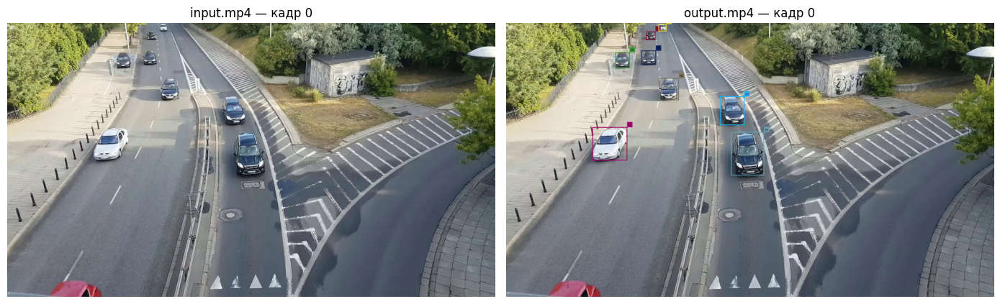

In [11]:
input_frame_0 = read_frame(INPUT_VIDEO_PATH, 0)
output_frame_0 = read_frame(OUTPUT_VIDEO_PATH, 0)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(input_frame_0)
plt.title("input.mp4 — кадр 0")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(output_frame_0)
plt.title("output.mp4 — кадр 0")
plt.axis("off")

plt.tight_layout()
plt.show()

## Показываем несколько кадров для проверки синхронности

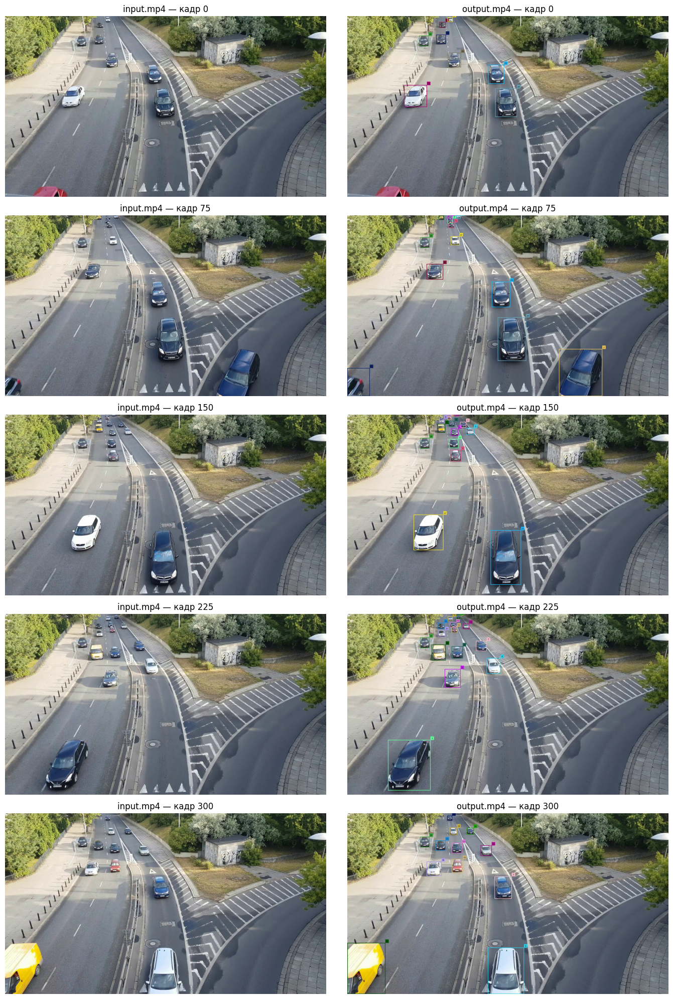

In [12]:
frame_count = min(input_video_info["frame_count"], output_video_info["frame_count"])

test_indices = [
    0,
    frame_count // 4,
    frame_count // 2,
    3 * frame_count // 4,
    frame_count - 1
]

fig, axes = plt.subplots(len(test_indices), 2, figsize=(14, 4 * len(test_indices)))

for row, idx in enumerate(test_indices):
    in_frame = read_frame(INPUT_VIDEO_PATH, idx)
    out_frame = read_frame(OUTPUT_VIDEO_PATH, idx)

    axes[row, 0].imshow(in_frame)
    axes[row, 0].set_title(f"input.mp4 — кадр {idx}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(out_frame)
    axes[row, 1].set_title(f"output.mp4 — кадр {idx}")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

## Строим разностную маску между исходным и размеченным кадром

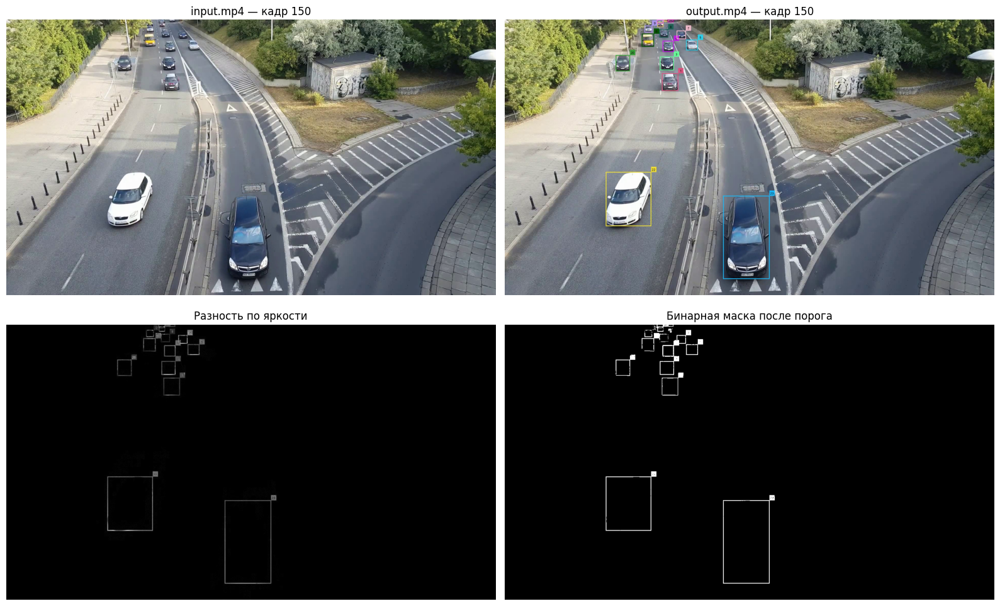

In [13]:
def get_diff_mask(input_frame_rgb, output_frame_rgb, threshold=40):
    diff = cv2.absdiff(output_frame_rgb, input_frame_rgb)
    diff_gray = cv2.cvtColor(diff, cv2.COLOR_RGB2GRAY)

    _, mask = cv2.threshold(diff_gray, threshold, 255, cv2.THRESH_BINARY)
    return diff, diff_gray, mask

test_idx = test_indices[len(test_indices) // 2]

input_test = read_frame(INPUT_VIDEO_PATH, test_idx)
output_test = read_frame(OUTPUT_VIDEO_PATH, test_idx)

diff_rgb, diff_gray, diff_mask = get_diff_mask(input_test, output_test, threshold=40)

plt.figure(figsize=(16, 10))

plt.subplot(2, 2, 1)
plt.imshow(input_test)
plt.title(f"input.mp4 — кадр {test_idx}")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(output_test)
plt.title(f"output.mp4 — кадр {test_idx}")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(diff_gray, cmap="gray")
plt.title("Разность по яркости")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(diff_mask, cmap="gray")
plt.title("Бинарная маска после порога")
plt.axis("off")

plt.tight_layout()
plt.show()

## Маска для поиска контуров

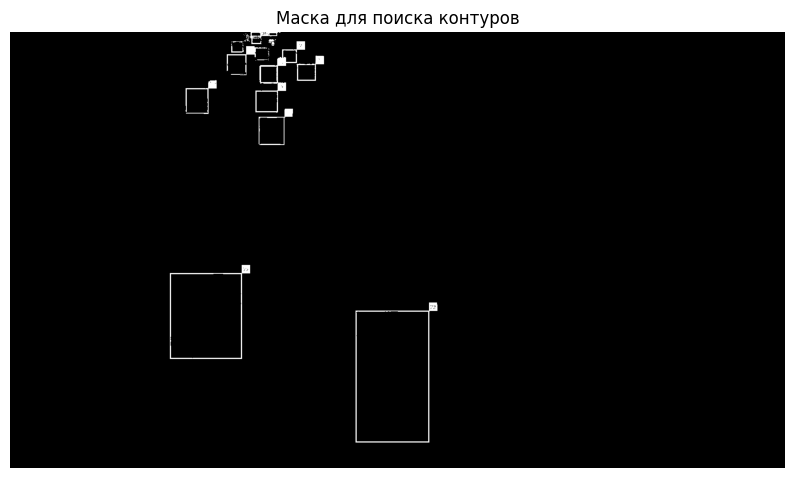

In [14]:
mask_for_contours = diff_mask.copy()

plt.figure(figsize=(10, 6))
plt.imshow(mask_for_contours, cmap="gray")
plt.title("Маска для поиска контуров")
plt.axis("off")
plt.show()

## Находим кандидаты в bounding box по бинарной маске

In [15]:
def extract_bboxes_from_mask(mask, min_area=80):
    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    bboxes = []

    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        area = w * h

        if area >= min_area:
            bboxes.append([x, y, w, h])

    bboxes = sorted(bboxes, key=lambda box: (box[1], box[0]))
    return bboxes


candidate_bboxes = extract_bboxes_from_mask(mask_for_contours, min_area=80)

print("Количество найденных кандидатов:", len(candidate_bboxes))
candidate_bboxes[:10]

Количество найденных кандидатов: 12


[[593, 0, 71, 30],
 [585, 6, 9, 18],
 [641, 18, 14, 16],
 [608, 23, 123, 177],
 [548, 34, 31, 17],
 [537, 35, 100, 62],
 [710, 58, 68, 63],
 [547, 80, 39, 27],
 [435, 119, 77, 84],
 [616, 190, 85, 90]]

## Визуализируем найденных кандидатов

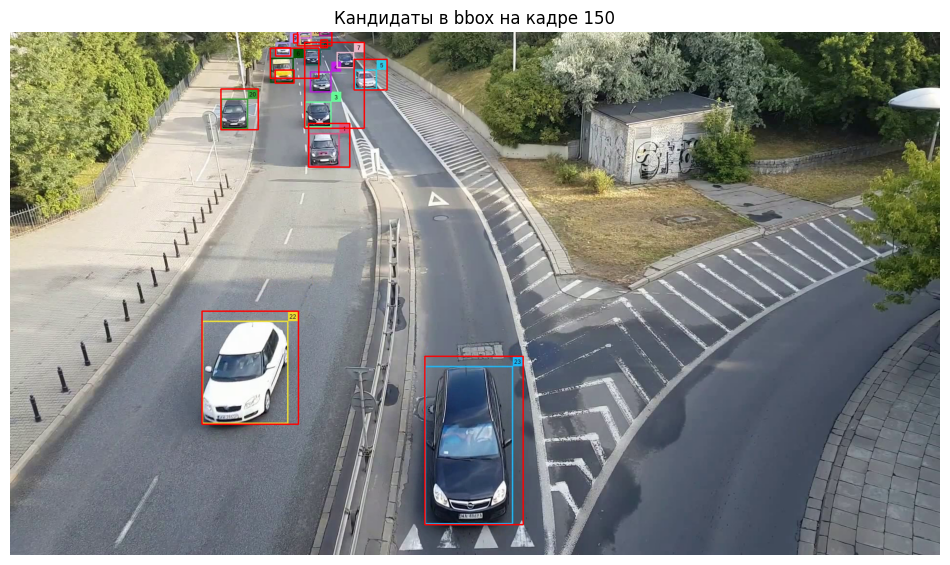

In [16]:
def draw_bboxes_rgb(image_rgb, bboxes, color=(255, 0, 0), thickness=2):
    image = image_rgb.copy()

    for x, y, w, h in bboxes:
        cv2.rectangle(
            image,
            (int(x), int(y)),
            (int(x + w), int(y + h)),
            color,
            thickness
        )

    return image


vis_candidates = draw_bboxes_rgb(
    output_test,
    candidate_bboxes,
    color=(255, 0, 0),
    thickness=2
)

plt.figure(figsize=(12, 8))
plt.imshow(vis_candidates)
plt.title(f"Кандидаты в bbox на кадре {test_idx}")
plt.axis("off")
plt.show()

## Некоторые рамки слишком крупные, потому что контур объединил сам bbox и маленькую подпись рядом с ним.
## В верхней части кадра есть пересекающиеся кандидаты, потому что там объекты маленькие, рамки близко друг к другу, и контуры могут накладываться.

## Пробуем извлекать прямоугольные контуры bbox

In [17]:
def extract_rectangular_bboxes_from_mask(
    mask,
    min_w=15,
    min_h=15,
    min_area=300,
    min_rectangularity=0.15
):
    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_TREE,
        cv2.CHAIN_APPROX_SIMPLE
    )

    bboxes = []

    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        area = w * h

        if w < min_w or h < min_h or area < min_area:
            continue

        contour_area = cv2.contourArea(contour)
        rectangularity = contour_area / area if area > 0 else 0

        if rectangularity < min_rectangularity:
            continue

        bboxes.append([x, y, w, h])

    bboxes = sorted(bboxes, key=lambda box: (box[1], box[0]))
    return bboxes


rect_bboxes = extract_rectangular_bboxes_from_mask(
    mask_for_contours,
    min_w=15,
    min_h=15,
    min_area=300,
    min_rectangularity=0.10
)

print("Количество прямоугольных кандидатов:", len(rect_bboxes))
rect_bboxes[:20]

Количество прямоугольных кандидатов: 15


[[593, 0, 71, 30],
 [608, 23, 123, 177],
 [548, 34, 31, 17],
 [537, 35, 100, 62],
 [710, 58, 68, 63],
 [713, 81, 44, 38],
 [621, 85, 41, 40],
 [435, 119, 77, 84],
 [610, 147, 53, 50],
 [616, 190, 85, 90],
 [617, 211, 62, 68],
 [396, 577, 199, 233],
 [397, 598, 177, 211],
 [856, 670, 203, 347],
 [857, 691, 180, 324]]

## Удаляем дублирующиеся bbox с помощью алгоритма подавления немаксимумов (NMS)

In [18]:
def bbox_xywh_to_xyxy(box):
    x, y, w, h = box
    return [x, y, x + w, y + h]


def bbox_iou_xywh(box_a, box_b):
    ax1, ay1, ax2, ay2 = bbox_xywh_to_xyxy(box_a)
    bx1, by1, bx2, by2 = bbox_xywh_to_xyxy(box_b)

    inter_x1 = max(ax1, bx1)
    inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2)
    inter_y2 = min(ay2, by2)

    inter_w = max(0, inter_x2 - inter_x1)
    inter_h = max(0, inter_y2 - inter_y1)
    inter_area = inter_w * inter_h

    area_a = max(0, ax2 - ax1) * max(0, ay2 - ay1)
    area_b = max(0, bx2 - bx1) * max(0, by2 - by1)

    union_area = area_a + area_b - inter_area

    if union_area == 0:
        return 0.0

    return inter_area / union_area


def nms_bboxes_xywh(bboxes, iou_threshold=0.5):
    if len(bboxes) == 0:
        return []

    bboxes = sorted(
        bboxes,
        key=lambda box: box[2] * box[3],
        reverse=True
    )

    keep = []

    while len(bboxes) > 0:
        current = bboxes.pop(0)
        keep.append(current)

        bboxes = [
            box for box in bboxes
            if bbox_iou_xywh(current, box) < iou_threshold
        ]

    return keep


nms_bboxes = nms_bboxes_xywh(
    rect_bboxes,
    iou_threshold=0.5
)

print("До NMS:", len(rect_bboxes))
print("После NMS:", len(nms_bboxes))
nms_bboxes

До NMS: 15
После NMS: 12


[[856, 670, 203, 347],
 [396, 577, 199, 233],
 [608, 23, 123, 177],
 [616, 190, 85, 90],
 [435, 119, 77, 84],
 [537, 35, 100, 62],
 [710, 58, 68, 63],
 [610, 147, 53, 50],
 [593, 0, 71, 30],
 [713, 81, 44, 38],
 [621, 85, 41, 40],
 [548, 34, 31, 17]]

## Смотрим результат после NMS

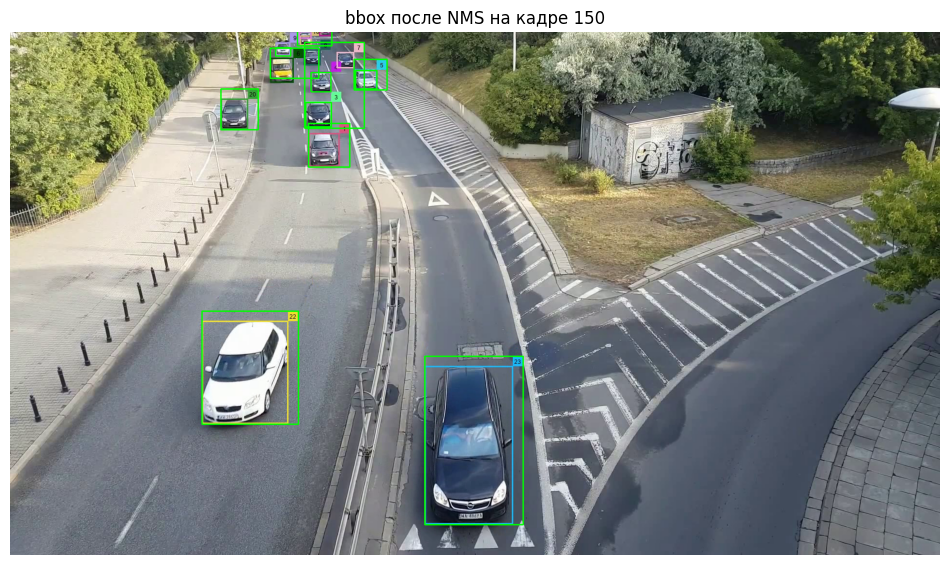

In [19]:
vis_nms = draw_bboxes_rgb(
    output_test,
    nms_bboxes,
    color=(0, 255, 0),
    thickness=2
)

plt.figure(figsize=(12, 8))
plt.imshow(vis_nms)
plt.title(f"bbox после NMS на кадре {test_idx}")
plt.axis("off")
plt.show()

## Сравним метод внешних контуров и метод с NMS рядом. Так мы поймём, какой оставить как основной для обработки всего видео.

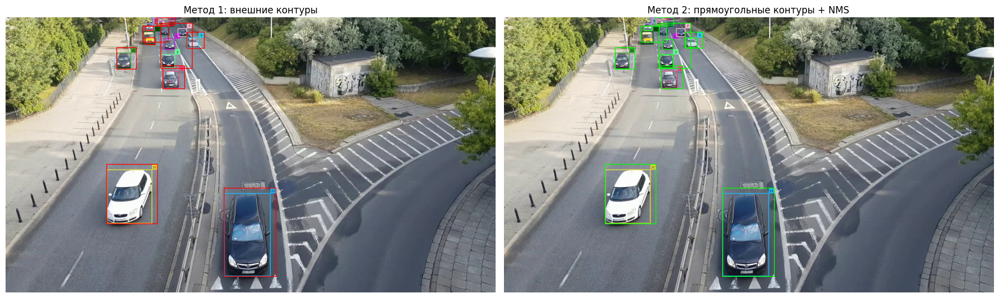

In [20]:
vis_external = draw_bboxes_rgb(
    output_test,
    candidate_bboxes,
    color=(255, 0, 0),
    thickness=2
)

vis_nms = draw_bboxes_rgb(
    output_test,
    nms_bboxes,
    color=(0, 255, 0),
    thickness=2
)

plt.figure(figsize=(18, 8))

plt.subplot(1, 2, 1)
plt.imshow(vis_external)
plt.title("Метод 1: внешние контуры")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(vis_nms)
plt.title("Метод 2: прямоугольные контуры + NMS")
plt.axis("off")

plt.tight_layout()
plt.show()

## Оформляем первый метод извлечения bbox в отдельную функцию

In [21]:
def extract_bboxes_method_diff_external(
    input_frame_rgb,
    output_frame_rgb,
    threshold=40,
    min_area=80
):
    _, _, diff_mask = get_diff_mask(
        input_frame_rgb,
        output_frame_rgb,
        threshold=threshold
    )

    bboxes = extract_bboxes_from_mask(
        diff_mask,
        min_area=min_area
    )

    return bboxes, diff_mask

## Метод работает следующим образом. Сначала строится разностная маска между кадром из исходного видео и соответствующим кадром из размеченного видео. Затем к этой маске применяется бинаризация, после чего по бинарной маске ищутся внешние контуры. Каждый достаточно крупный контур переводится в прямоугольник формата `[x, y, w, h]`.

## Оформляем второй метод извлечения bbox в отдельную функцию

In [22]:
def extract_bboxes_method_diff_rect_nms(
    input_frame_rgb,
    output_frame_rgb,
    threshold=40,
    min_w=15,
    min_h=15,
    min_area=300,
    min_rectangularity=0.10,
    iou_threshold=0.5
):
    _, _, diff_mask = get_diff_mask(
        input_frame_rgb,
        output_frame_rgb,
        threshold=threshold
    )

    rect_bboxes = extract_rectangular_bboxes_from_mask(
        diff_mask,
        min_w=min_w,
        min_h=min_h,
        min_area=min_area,
        min_rectangularity=min_rectangularity
    )

    nms_bboxes = nms_bboxes_xywh(
        rect_bboxes,
        iou_threshold=iou_threshold
    )

    return nms_bboxes, diff_mask

## Здесь оформляется второй метод извлечения bbox. Он также начинается с построения разностной маски, но затем использует более подробный поиск контуров, включая вложенные контуры. После этого применяется NMS, чтобы удалить дублирующиеся прямоугольники.



## Проверяем оба метода на нескольких кадрах

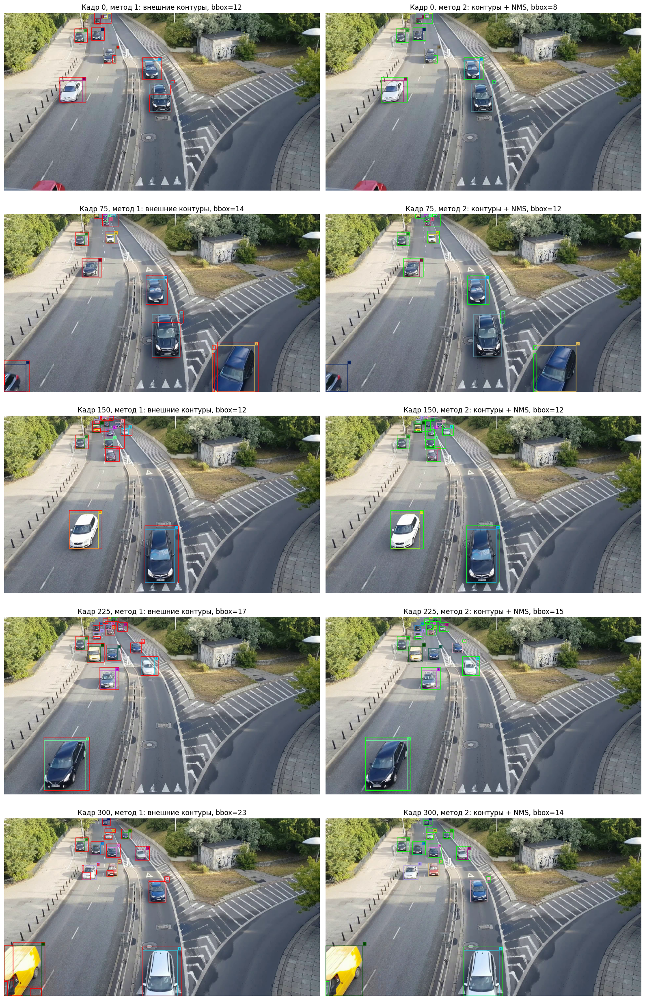

In [23]:
sample_indices = [
    0,
    frame_count // 4,
    frame_count // 2,
    3 * frame_count // 4,
    frame_count - 1
]

fig, axes = plt.subplots(len(sample_indices), 2, figsize=(16, 5 * len(sample_indices)))

for row, idx in enumerate(sample_indices):
    input_frame = read_frame(INPUT_VIDEO_PATH, idx)
    output_frame = read_frame(OUTPUT_VIDEO_PATH, idx)

    bboxes_m1, _ = extract_bboxes_method_diff_external(
        input_frame,
        output_frame,
        threshold=40,
        min_area=80
    )

    bboxes_m2, _ = extract_bboxes_method_diff_rect_nms(
        input_frame,
        output_frame,
        threshold=40,
        min_w=15,
        min_h=15,
        min_area=300,
        min_rectangularity=0.10,
        iou_threshold=0.5
    )

    vis_m1 = draw_bboxes_rgb(
        output_frame,
        bboxes_m1,
        color=(255, 0, 0),
        thickness=2
    )

    vis_m2 = draw_bboxes_rgb(
        output_frame,
        bboxes_m2,
        color=(0, 255, 0),
        thickness=2
    )

    axes[row, 0].imshow(vis_m1)
    axes[row, 0].set_title(f"Кадр {idx}, метод 1: внешние контуры, bbox={len(bboxes_m1)}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(vis_m2)
    axes[row, 1].set_title(f"Кадр {idx}, метод 2: контуры + NMS, bbox={len(bboxes_m2)}")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

# Итого: 2 метод лучше, потому что:
# - он даёт меньше лишних мелких bbox;
# - метод 1 часто оставляет дополнительные прямоугольники от подписей, маленьких маркеров и фрагментов рамок.

## Выбираем основной метод извлечения bbox

In [24]:
def extract_bboxes_selected(
    input_frame_rgb,
    output_frame_rgb,
    threshold=40,
    min_w=15,
    min_h=15,
    min_area=300,
    min_rectangularity=0.10,
    iou_threshold=0.5
):
    bboxes, diff_mask = extract_bboxes_method_diff_rect_nms(
        input_frame_rgb=input_frame_rgb,
        output_frame_rgb=output_frame_rgb,
        threshold=threshold,
        min_w=min_w,
        min_h=min_h,
        min_area=min_area,
        min_rectangularity=min_rectangularity,
        iou_threshold=iou_threshold
    )

    return bboxes, diff_mask

## Извлекаем bbox для всех кадров видео

In [25]:
def extract_all_bboxes_from_video(
    input_video_path,
    output_video_path,
    frame_count,
    max_frames=None
):
    results = []

    total_frames = frame_count if max_frames is None else min(frame_count, max_frames)

    for frame_idx in tqdm(range(total_frames), desc="Извлечение bbox"):
        input_frame = read_frame(input_video_path, frame_idx)
        output_frame = read_frame(output_video_path, frame_idx)

        bboxes, _ = extract_bboxes_selected(
            input_frame,
            output_frame,
            threshold=40,
            min_w=15,
            min_h=15,
            min_area=300,
            min_rectangularity=0.10,
            iou_threshold=0.5
        )

        for bbox in bboxes:
            x, y, w, h = bbox

            results.append(
                {
                    "frame_idx": frame_idx,
                    "x": int(x),
                    "y": int(y),
                    "w": int(w),
                    "h": int(h),
                    "area": int(w * h)
                }
            )

    return pd.DataFrame(results)


extracted_bboxes_df = extract_all_bboxes_from_video(
    INPUT_VIDEO_PATH,
    OUTPUT_VIDEO_PATH,
    frame_count=frame_count,
    max_frames=None
)

extracted_bboxes_df.head()

Извлечение bbox: 100%|██████████| 301/301 [01:06<00:00,  4.51it/s]


,frame_idx,x,y,w,h,area
0,0,338,392,159,152,24168
1,0,842,271,116,135,15660
2,0,549,0,102,66,6732
3,0,429,98,78,82,6396
4,0,531,91,79,77,6083


## Смотрим общую статистику извлечённых bbox

In [26]:
print("Всего извлечённых bbox:", len(extracted_bboxes_df))
print("Количество кадров с найденными bbox:", extracted_bboxes_df["frame_idx"].nunique())
print("Всего кадров в видео:", frame_count)

extracted_bboxes_df.describe()

Всего извлечённых bbox: 3430
Количество кадров с найденными bbox: 301
Всего кадров в видео: 301


,frame_idx,x,y,w,h,area
count,3430.000000,3430.000000,3430.000000,3430.000000,3430.000000,3430.000000
mean,166.908163,639.062099,154.252770,68.139359,70.545773,7541.463265
std,82.043068,161.617791,195.845522,48.168925,60.969857,13471.182690
min,0.000000,0.000000,0.000000,15.000000,15.000000,300.000000
25%,102.000000,571.000000,29.000000,33.000000,28.000000,947.500000
50%,176.500000,614.000000,90.000000,55.000000,52.000000,2736.000000
75%,235.000000,692.000000,162.000000,81.000000,84.000000,6468.000000
max,300.000000,1727.000000,1063.000000,300.000000,382.000000,97240.000000


## Анализируем количество bbox на каждом кадре

In [27]:
bbox_count_per_frame = (
    extracted_bboxes_df
    .groupby("frame_idx")
    .size()
    .reset_index(name="bbox_count")
)

bbox_count_per_frame.head(10)

,frame_idx,bbox_count
0,0,8
1,1,8
2,2,7
3,3,6
4,4,6
5,5,5
6,6,8
7,7,7
8,8,7
9,9,7


## Строим график количества bbox по кадрам

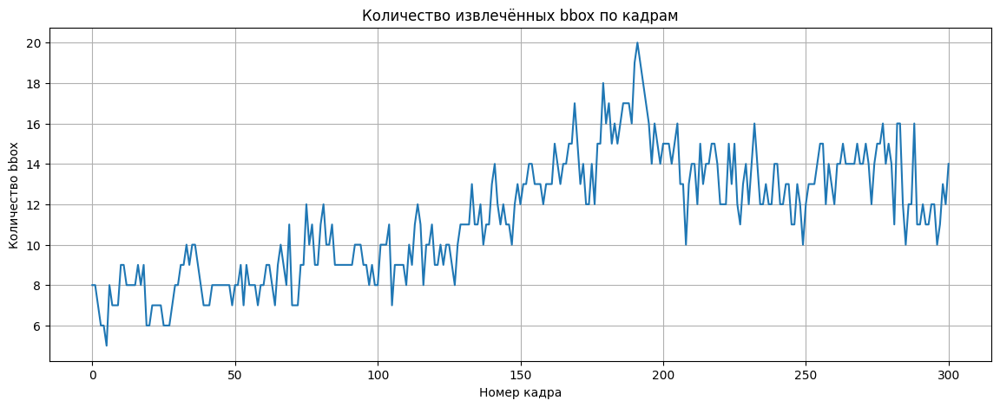

In [28]:
plt.figure(figsize=(14, 5))
plt.plot(bbox_count_per_frame["frame_idx"], bbox_count_per_frame["bbox_count"])
plt.xlabel("Номер кадра")
plt.ylabel("Количество bbox")
plt.title("Количество извлечённых bbox по кадрам")
plt.grid(True)
plt.show()

## Сохраняем извлечённые bbox в CSV

In [29]:
extracted_csv_path = PROJECT_DIR / "extracted_bboxes.csv"

extracted_bboxes_df.to_csv(extracted_csv_path, index=False)

print("CSV сохранён в:", extracted_csv_path)

CSV сохранён в: /content/extracted_bboxes.csv


## Просматриваем начало файла с оригинальной разметкой

In [30]:
print("Путь к оригинальной разметке:", ORIG_ANN_PATH)
print("Файл существует:", ORIG_ANN_PATH.exists())

with open(ORIG_ANN_PATH, "r", encoding="utf-8") as f:
    for i in range(60):
        line = f.readline()
        if not line:
            break
        print(line.rstrip())

Путь к оригинальной разметке: /content/annotations.xml
Файл существует: True
<?xml version="1.0" encoding="utf-8"?>
<annotations>
  <version>1.1</version>
  <meta>
    <task>
      <mode>interpolation</mode>
      <overlap>5</overlap>
      <start_frame>0</start_frame>
      <stop_frame>300</stop_frame>
      <segments>
        <segment>
          <start>0</start>
          <stop>300</stop>
        </segment>
      </segments>
      <owner>
        <username>Training Data</username>
      </owner>
      <labels>
        <label>
          <name>car</name>
          <color>#2a00ff</color>
          <type>rectangle</type>
          <attributes>
          </attributes>
        </label>
        <label>
          <name>minivan</name>
          <color>#b725ff</color>
          <type>rectangle</type>
          <attributes>
          </attributes>
        </label>
      </labels>
      <original_size>
        <width>1920</width>
        <height>1080</height>
      </original_size>
      <source

## Парсим разметку

In [31]:
import xml.etree.ElementTree as ET

def parse_cvat_xml_annotations(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    rows = []

    for track in root.findall("track"):
        track_id = int(track.attrib["id"])
        label = track.attrib["label"]

        for box in track.findall("box"):
            outside = int(box.attrib.get("outside", 0))

            if outside == 1:
                continue

            frame_idx = int(box.attrib["frame"])

            xtl = float(box.attrib["xtl"])
            ytl = float(box.attrib["ytl"])
            xbr = float(box.attrib["xbr"])
            ybr = float(box.attrib["ybr"])

            x = xtl
            y = ytl
            w = xbr - xtl
            h = ybr - ytl

            if w <= 0 or h <= 0:
                continue

            rows.append(
                {
                    "frame_idx": frame_idx,
                    "track_id": track_id,
                    "label": label,
                    "x": x,
                    "y": y,
                    "w": w,
                    "h": h,
                    "area": w * h,
                }
            )

    return pd.DataFrame(rows)


gt_bboxes_df = parse_cvat_xml_annotations(ORIG_ANN_PATH)

print("Количество bbox в оригинальной разметке:", len(gt_bboxes_df))
print("Количество кадров с оригинальной разметкой:", gt_bboxes_df["frame_idx"].nunique())

gt_bboxes_df.head()

Количество bbox в оригинальной разметке: 9659
Количество кадров с оригинальной разметкой: 901


,frame_idx,track_id,label,x,y,w,h,area
0,27,0,car,592.83,0.0,25.15,12.08,303.8120
1,28,0,car,592.83,0.0,25.53,13.08,333.9324
2,29,0,car,592.83,0.0,25.90,14.09,364.9310
3,30,0,car,592.83,0.0,26.27,15.10,396.6770
4,31,0,car,592.95,0.0,26.51,16.19,429.1969


## Проверяем классы оригинальной разметки

In [32]:
print("Классы в оригинальной разметке:")
print(gt_bboxes_df["label"].value_counts())

print("\nСтатистика оригинальных bbox:")
gt_bboxes_df.describe()

Классы в оригинальной разметке:
label
car        9419
minivan     240
Name: count, dtype: int64

Статистика оригинальных bbox:


,frame_idx,track_id,x,y,w,h,area
count,9659.000000,9659.000000,9659.000000,9659.00000,9659.000000,9659.000000,9659.000000
mean,434.408013,11.272388,619.442735,201.48249,70.161476,75.632582,7315.010738
std,257.802729,5.166380,159.799608,161.60179,40.611247,51.905945,11392.689690
min,0.000000,0.000000,0.000000,0.00000,18.200000,7.900000,143.780000
25%,208.000000,8.000000,521.000000,101.21000,47.080000,43.390000,2042.801200
50%,418.000000,11.000000,605.000000,175.27000,63.170000,64.370000,4080.127300
75%,659.000000,14.000000,725.320000,330.30000,78.370000,95.900000,7515.683000
max,900.000000,23.000000,1727.510000,973.18000,322.220000,390.890000,115971.313000


## Сравниваем количество bbox по кадрам

In [33]:
gt_count_per_frame = (
    gt_bboxes_df
    .groupby("frame_idx")
    .size()
    .reset_index(name="gt_bbox_count")
)

extracted_count_per_frame = (
    extracted_bboxes_df
    .groupby("frame_idx")
    .size()
    .reset_index(name="extracted_bbox_count")
)

count_compare_df = pd.merge(
    gt_count_per_frame,
    extracted_count_per_frame,
    on="frame_idx",
    how="outer"
).fillna(0)

count_compare_df["gt_bbox_count"] = count_compare_df["gt_bbox_count"].astype(int)
count_compare_df["extracted_bbox_count"] = count_compare_df["extracted_bbox_count"].astype(int)

count_compare_df["count_diff"] = (
    count_compare_df["extracted_bbox_count"] - count_compare_df["gt_bbox_count"]
)

count_compare_df.head(10)

,frame_idx,gt_bbox_count,extracted_bbox_count,count_diff
0,0,8,8,0
1,1,8,8,0
2,2,8,7,-1
3,3,8,6,-2
4,4,8,6,-2
5,5,8,5,-3
6,6,8,8,0
7,7,8,7,-1
8,8,8,7,-1
9,9,8,7,-1


## Строим график сравнения количества bbox

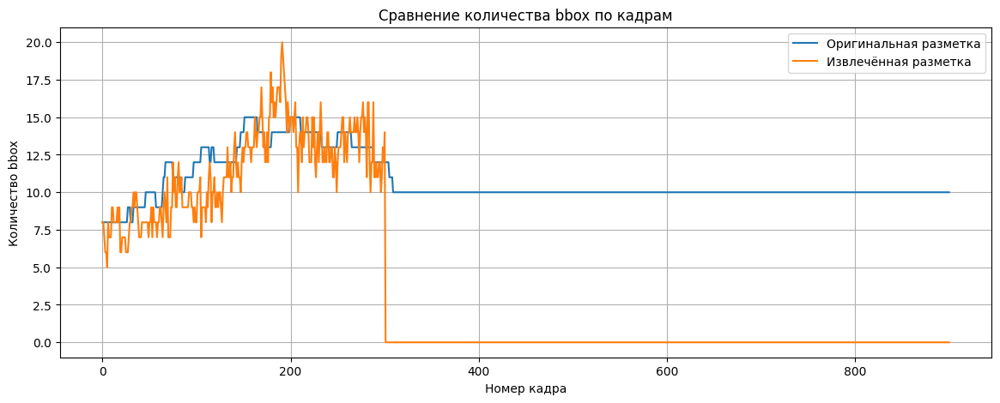

In [34]:
plt.figure(figsize=(14, 5))

plt.plot(
    count_compare_df["frame_idx"],
    count_compare_df["gt_bbox_count"],
    label="Оригинальная разметка"
)

plt.plot(
    count_compare_df["frame_idx"],
    count_compare_df["extracted_bbox_count"],
    label="Извлечённая разметка"
)

plt.xlabel("Номер кадра")
plt.ylabel("Количество bbox")
plt.title("Сравнение количества bbox по кадрам")
plt.grid(True)
plt.legend()
plt.show()

## Синяя линия оригинальной разметки уходит примерно до кадра 900, а наше видео содержит только 301 кадр. Из-за этого после кадра 300 извлечённая разметка становится нулевой, потому что у нас таких кадров физически нет.

## Диапазон кадров в ориг разметке

In [35]:
print("Видео, всего кадров:", frame_count)

print("\nИзвлечённая разметка:")
print("min frame:", extracted_bboxes_df["frame_idx"].min())
print("max frame:", extracted_bboxes_df["frame_idx"].max())
print("unique frames:", extracted_bboxes_df["frame_idx"].nunique())

print("\nОригинальная разметка:")
print("min frame:", gt_bboxes_df["frame_idx"].min())
print("max frame:", gt_bboxes_df["frame_idx"].max())
print("unique frames:", gt_bboxes_df["frame_idx"].nunique())

Видео, всего кадров: 301

Извлечённая разметка:
min frame: 0
max frame: 300
unique frames: 301

Оригинальная разметка:
min frame: 0
max frame: 900
unique frames: 901


## Оригинальный XML содержит кадры 0–900, а видео, которое мы обрабатываем, содержит только 0–300. Значит, будем использовать первые 301 кадр оригинальной разметки

In [36]:
gt_bboxes_df_video = gt_bboxes_df[
    gt_bboxes_df["frame_idx"].between(0, frame_count - 1)
].copy()

extracted_bboxes_df_video = extracted_bboxes_df[
    extracted_bboxes_df["frame_idx"].between(0, frame_count - 1)
].copy()

print("Оригинальных bbox после фильтрации:", len(gt_bboxes_df_video))
print("Извлечённых bbox после фильтрации:", len(extracted_bboxes_df_video))

print("\nКадры оригинальной разметки после фильтрации:")
print(gt_bboxes_df_video["frame_idx"].min(), "-", gt_bboxes_df_video["frame_idx"].max())

print("\nКадры извлечённой разметки после фильтрации:")
print(extracted_bboxes_df_video["frame_idx"].min(), "-", extracted_bboxes_df_video["frame_idx"].max())

Оригинальных bbox после фильтрации: 3647
Извлечённых bbox после фильтрации: 3430

Кадры оригинальной разметки после фильтрации:
0 - 300

Кадры извлечённой разметки после фильтрации:
0 - 300


## Сравниваем количество bbox только на кадрах видео

In [37]:
all_video_frames = pd.DataFrame({"frame_idx": list(range(frame_count))})

gt_count_per_frame = (
    gt_bboxes_df_video
    .groupby("frame_idx")
    .size()
    .reset_index(name="gt_bbox_count")
)

extracted_count_per_frame = (
    extracted_bboxes_df_video
    .groupby("frame_idx")
    .size()
    .reset_index(name="extracted_bbox_count")
)

count_compare_df = (
    all_video_frames
    .merge(gt_count_per_frame, on="frame_idx", how="left")
    .merge(extracted_count_per_frame, on="frame_idx", how="left")
    .fillna(0)
)

count_compare_df["gt_bbox_count"] = count_compare_df["gt_bbox_count"].astype(int)
count_compare_df["extracted_bbox_count"] = count_compare_df["extracted_bbox_count"].astype(int)

count_compare_df["count_diff"] = (
    count_compare_df["extracted_bbox_count"] - count_compare_df["gt_bbox_count"]
)

count_compare_df.head(10)

,frame_idx,gt_bbox_count,extracted_bbox_count,count_diff
0,0,8,8,0
1,1,8,8,0
2,2,8,7,-1
3,3,8,6,-2
4,4,8,6,-2
5,5,8,5,-3
6,6,8,8,0
7,7,8,7,-1
8,8,8,7,-1
9,9,8,7,-1


## Строим исправленный график сравнения кол-ва bbox

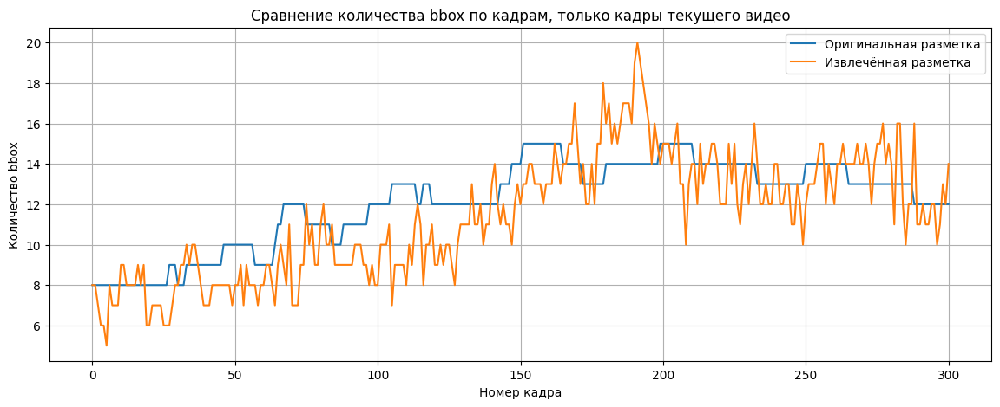

In [38]:
plt.figure(figsize=(14, 5))

plt.plot(
    count_compare_df["frame_idx"],
    count_compare_df["gt_bbox_count"],
    label="Оригинальная разметка"
)

plt.plot(
    count_compare_df["frame_idx"],
    count_compare_df["extracted_bbox_count"],
    label="Извлечённая разметка"
)

plt.xlabel("Номер кадра")
plt.ylabel("Количество bbox")
plt.title("Сравнение количества bbox по кадрам, только кадры текущего видео")
plt.grid(True)
plt.legend()
plt.show()

  ## После ограничения оригинальной разметки диапазоном кадров текущего видео график стал корректным: сравнение выполняется только на кадрах 0–300

  ## По количеству объектов метод работает разумно, но график показывает, что восстановленная разметка содержит как ложные срабатывания, так и пропуски. Поэтому для более точной оценки необходимо перейти к сравнению координат через IoU

## Реализуем функцию расчёта IoU

In [39]:
def bbox_iou_xywh_float(box_a, box_b):
    ax, ay, aw, ah = box_a
    bx, by, bw, bh = box_b

    ax1, ay1, ax2, ay2 = ax, ay, ax + aw, ay + ah
    bx1, by1, bx2, by2 = bx, by, bx + bw, by + bh

    inter_x1 = max(ax1, bx1)
    inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2)
    inter_y2 = min(ay2, by2)

    inter_w = max(0, inter_x2 - inter_x1)
    inter_h = max(0, inter_y2 - inter_y1)
    inter_area = inter_w * inter_h

    area_a = max(0, aw) * max(0, ah)
    area_b = max(0, bw) * max(0, bh)

    union_area = area_a + area_b - inter_area

    if union_area <= 0:
        return 0.0

    return inter_area / union_area

## Сопоставляем bbox на одном кадре по IoU

In [40]:
def match_bboxes_one_frame(gt_boxes, pred_boxes, iou_threshold=0.5):
    matches = []
    used_gt = set()
    used_pred = set()

    pairs = []

    for gt_idx, gt_box in enumerate(gt_boxes):
        for pred_idx, pred_box in enumerate(pred_boxes):
            iou = bbox_iou_xywh_float(gt_box, pred_box)
            pairs.append((iou, gt_idx, pred_idx))

    pairs = sorted(pairs, reverse=True, key=lambda x: x[0])

    for iou, gt_idx, pred_idx in pairs:
        if iou < iou_threshold:
            continue

        if gt_idx in used_gt or pred_idx in used_pred:
            continue

        used_gt.add(gt_idx)
        used_pred.add(pred_idx)

        matches.append(
            {
                "gt_idx": gt_idx,
                "pred_idx": pred_idx,
                "iou": iou
            }
        )

    false_negatives = len(gt_boxes) - len(used_gt)
    false_positives = len(pred_boxes) - len(used_pred)

    return matches, false_positives, false_negatives

## Считаем IoU по всем кадрам

In [41]:
def evaluate_extracted_bboxes_iou(gt_df, pred_df, frame_count, iou_threshold=0.5):
    rows = []

    for frame_idx in tqdm(range(frame_count), desc="Оценка IoU"):
        gt_frame = gt_df[gt_df["frame_idx"] == frame_idx]
        pred_frame = pred_df[pred_df["frame_idx"] == frame_idx]

        gt_boxes = gt_frame[["x", "y", "w", "h"]].values.tolist()
        pred_boxes = pred_frame[["x", "y", "w", "h"]].values.tolist()

        matches, fp, fn = match_bboxes_one_frame(
            gt_boxes,
            pred_boxes,
            iou_threshold=iou_threshold
        )

        for match in matches:
            rows.append(
                {
                    "frame_idx": frame_idx,
                    "iou": match["iou"],
                    "matched": 1,
                    "false_positive": 0,
                    "false_negative": 0
                }
            )

        for _ in range(fp):
            rows.append(
                {
                    "frame_idx": frame_idx,
                    "iou": 0.0,
                    "matched": 0,
                    "false_positive": 1,
                    "false_negative": 0
                }
            )

        for _ in range(fn):
            rows.append(
                {
                    "frame_idx": frame_idx,
                    "iou": 0.0,
                    "matched": 0,
                    "false_positive": 0,
                    "false_negative": 1
                }
            )

    return pd.DataFrame(rows)


iou_eval_df = evaluate_extracted_bboxes_iou(
    gt_bboxes_df_video,
    extracted_bboxes_df_video,
    frame_count=frame_count,
    iou_threshold=0.5
)

iou_eval_df.head()

Оценка IoU: 100%|██████████| 301/301 [00:00<00:00, 565.65it/s]


,frame_idx,iou,matched,false_positive,false_negative
0,0,0.841580,1,0,0
1,0,0.739326,1,0,0
2,0,0.686979,1,0,0
3,0,0.559742,1,0,0
4,0,0.532863,1,0,0


## У всех значения > 0.5, подходит

## Считаем итоговые метрики качества извлечения

In [42]:
tp = int(iou_eval_df["matched"].sum())
fp = int(iou_eval_df["false_positive"].sum())
fn = int(iou_eval_df["false_negative"].sum())

precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

matched_ious = iou_eval_df.loc[iou_eval_df["matched"] == 1, "iou"]
mean_iou_matched = matched_ious.mean() if len(matched_ious) > 0 else 0

metrics_summary = pd.DataFrame(
    {
        "metric": [
            "true_positive",
            "false_positive",
            "false_negative",
            "precision@IoU0.5",
            "recall@IoU0.5",
            "f1@IoU0.5",
            "mean_iou_matched"
        ],
        "value": [
            tp,
            fp,
            fn,
            precision,
            recall,
            f1,
            mean_iou_matched
        ]
    }
)

metrics_summary

,metric,value
0,true_positive,2023.000000
1,false_positive,1407.000000
2,false_negative,1624.000000
3,precision@IoU0.5,0.589796
4,recall@IoU0.5,0.554702
5,f1@IoU0.5,0.571711
6,mean_iou_matched,0.741068


### Полученные метрики показывают, что восстановленная разметка имеет среднее качество. При пороге `IoU >= 0.5` было найдено 2023 корректных соответствия с оригинальной разметкой. Precision составил около 0.59, то есть примерно 59% найденных bbox соответствуют объектам из эталонной разметки. Recall составил около 0.55, значит метод восстановил примерно 55% объектов из оригинальной разметки. Средний IoU по успешно сопоставленным bbox равен примерно 0.74

### Вывод: метод не идеальный по полноте и числу ложных срабатываний, но те bbox, которые он находит правильно, обычно локализованы достаточно точно

## Строим распределение IoU для успешных совпадений

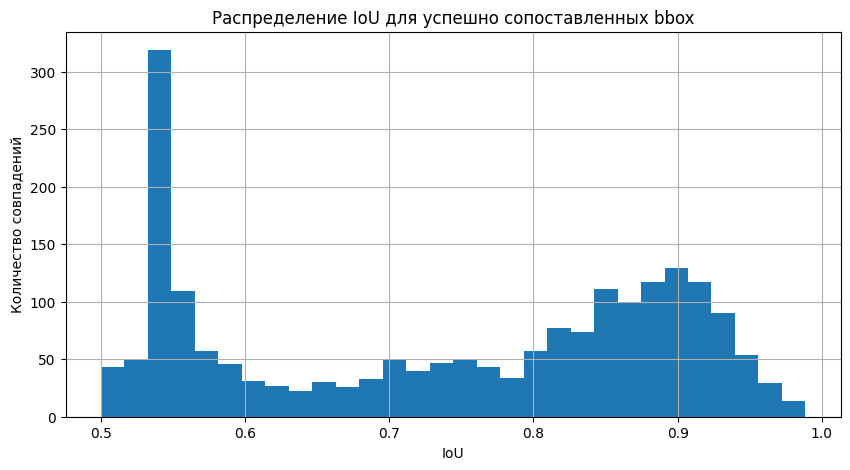

In [43]:
plt.figure(figsize=(10, 5))
plt.hist(matched_ious, bins=30)
plt.xlabel("IoU")
plt.ylabel("Количество совпадений")
plt.title("Распределение IoU для успешно сопоставленных bbox")
plt.grid(True)
plt.show()

## Сохраняем результаты оценки IoU

In [44]:
iou_eval_path = PROJECT_DIR / "iou_evaluation.csv"
metrics_path = PROJECT_DIR / "extraction_metrics.csv"

iou_eval_df.to_csv(iou_eval_path, index=False)
metrics_summary.to_csv(metrics_path, index=False)

print("Оценка IoU сохранена:", iou_eval_path)
print("Итоговые метрики сохранены:", metrics_path)

Оценка IoU сохранена: /content/iou_evaluation.csv
Итоговые метрики сохранены: /content/extraction_metrics.csv


## Создаём папки для кадров и COCO-аннотаций

In [45]:
FRAMES_DIR = PROJECT_DIR / "frames"
COCO_DIR = PROJECT_DIR / "coco_dataset"
COCO_IMAGES_DIR = COCO_DIR / "images"
COCO_ANN_DIR = COCO_DIR / "annotations"

FRAMES_DIR.mkdir(parents=True, exist_ok=True)
COCO_IMAGES_DIR.mkdir(parents=True, exist_ok=True)
COCO_ANN_DIR.mkdir(parents=True, exist_ok=True)

print("FRAMES_DIR:", FRAMES_DIR)
print("COCO_IMAGES_DIR:", COCO_IMAGES_DIR)
print("COCO_ANN_DIR:", COCO_ANN_DIR)

FRAMES_DIR: /content/frames
COCO_IMAGES_DIR: /content/coco_dataset/images
COCO_ANN_DIR: /content/coco_dataset/annotations


## Декодируем input.mp4 в последовательность кадров

In [46]:
def save_video_frames(video_path, output_dir, frame_count):
    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        raise ValueError(f"Не удалось открыть видео: {video_path}")

    saved_paths = []

    for frame_idx in tqdm(range(frame_count), desc="Сохранение кадров"):
        ret, frame = cap.read()

        if not ret:
            break

        frame_name = f"frame_{frame_idx:06d}.jpg"
        frame_path = output_dir / frame_name

        cv2.imwrite(str(frame_path), frame)
        saved_paths.append(frame_path)

    cap.release()
    return saved_paths


saved_frame_paths = save_video_frames(
    INPUT_VIDEO_PATH,
    COCO_IMAGES_DIR,
    frame_count
)

print("Сохранено кадров:", len(saved_frame_paths))

Сохранение кадров: 100%|██████████| 301/301 [00:04<00:00, 64.47it/s]

Сохранено кадров: 301


## Формируем train/val/split по кадрам

In [47]:
all_frame_indices = list(range(frame_count))

random.seed(42)
random.shuffle(all_frame_indices)

val_ratio = 0.2
val_size = int(len(all_frame_indices) * val_ratio)

val_frames = sorted(all_frame_indices[:val_size])
train_frames = sorted(all_frame_indices[val_size:])

print("Train frames:", len(train_frames))
print("Val frames:", len(val_frames))
print("Пример train:", train_frames[:10])
print("Пример val:", val_frames[:10])

Train frames: 241
Val frames: 60
Пример train: [0, 2, 3, 4, 7, 8, 9, 10, 11, 12]
Пример val: [1, 5, 6, 19, 24, 26, 32, 34, 37, 38]


## Создаём функцию формирования COCO JSON

In [48]:
def build_coco_from_dataframe(bboxes_df, frame_indices, image_width, image_height):
    images = []
    annotations = []
    categories = [
        {
            "id": 1,
            "name": "vehicle",
            "supercategory": "vehicle"
        }
    ]

    ann_id = 1

    for frame_idx in frame_indices:
        image_id = int(frame_idx) + 1
        file_name = f"frame_{frame_idx:06d}.jpg"

        images.append(
            {
                "id": image_id,
                "file_name": file_name,
                "width": int(image_width),
                "height": int(image_height)
            }
        )

        frame_boxes = bboxes_df[bboxes_df["frame_idx"] == frame_idx]

        for _, row in frame_boxes.iterrows():
            x = float(row["x"])
            y = float(row["y"])
            w = float(row["w"])
            h = float(row["h"])

            if w <= 0 or h <= 0:
                continue

            annotations.append(
                {
                    "id": ann_id,
                    "image_id": image_id,
                    "category_id": 1,
                    "bbox": [x, y, w, h],
                    "area": float(w * h),
                    "iscrowd": 0
                }
            )

            ann_id += 1

    coco_dict = {
        "info": {
            "description": "Extracted vehicle annotations from output.mp4",
            "version": "1.0"
        },
        "licenses": [],
        "images": images,
        "annotations": annotations,
        "categories": categories
    }

    return coco_dict

## Сохраняем COCO-аннотации для train и val

In [49]:
image_width = input_video_info["width"]
image_height = input_video_info["height"]

coco_train = build_coco_from_dataframe(
    extracted_bboxes_df_video,
    train_frames,
    image_width,
    image_height
)

coco_val = build_coco_from_dataframe(
    extracted_bboxes_df_video,
    val_frames,
    image_width,
    image_height
)

train_json_path = COCO_ANN_DIR / "instances_train.json"
val_json_path = COCO_ANN_DIR / "instances_val.json"

with open(train_json_path, "w", encoding="utf-8") as f:
    json.dump(coco_train, f, ensure_ascii=False, indent=2)

with open(val_json_path, "w", encoding="utf-8") as f:
    json.dump(coco_val, f, ensure_ascii=False, indent=2)

print("Train COCO сохранён:", train_json_path)
print("Val COCO сохранён:", val_json_path)

print("Train images:", len(coco_train["images"]))
print("Train annotations:", len(coco_train["annotations"]))
print("Val images:", len(coco_val["images"]))
print("Val annotations:", len(coco_val["annotations"]))

Train COCO сохранён: /content/coco_dataset/annotations/instances_train.json
Val COCO сохранён: /content/coco_dataset/annotations/instances_val.json
Train images: 241
Train annotations: 2733
Val images: 60
Val annotations: 697


## Проверяем структуру COCO JSON

In [50]:
print("Ключи COCO:", coco_train.keys())
print("Пример image:")
print(coco_train["images"][0])

print("\nПример annotation:")
print(coco_train["annotations"][0])

print("\nCategories:")
print(coco_train["categories"])

Ключи COCO: dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])
Пример image:
{'id': 1, 'file_name': 'frame_000000.jpg', 'width': 1920, 'height': 1080}

Пример annotation:
{'id': 1, 'image_id': 1, 'category_id': 1, 'bbox': [338.0, 392.0, 159.0, 152.0], 'area': 24168.0, 'iscrowd': 0}

Categories:
[{'id': 1, 'name': 'vehicle', 'supercategory': 'vehicle'}]


## Теперь начинаем этап обучения модели детекции. Для этого используются torch и torchvision. Используем Faster R-CNN.

## Создаём Dataset для COCO-разметки

In [51]:
class VehicleCocoDataset(Dataset):
    def __init__(self, images_dir, coco_json_path):
        self.images_dir = Path(images_dir)

        with open(coco_json_path, "r", encoding="utf-8") as f:
            self.coco = json.load(f)

        self.images = self.coco["images"]
        self.annotations = self.coco["annotations"]

        self.ann_by_image = defaultdict(list)
        for ann in self.annotations:
            self.ann_by_image[ann["image_id"]].append(ann)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_info = self.images[idx]
        image_id = image_info["id"]
        file_name = image_info["file_name"]

        image_path = self.images_dir / file_name
        image = Image.open(image_path).convert("RGB")

        TARGET_SIZE = 640
        orig_w, orig_h = image.size
        scale = TARGET_SIZE / max(orig_w, orig_h)
        new_w = int(orig_w * scale)
        new_h = int(orig_h * scale)
        image = image.resize((new_w, new_h), Image.BILINEAR)

        image_np = np.array(image)
        image_tensor = torch.as_tensor(image_np, dtype=torch.float32).permute(2, 0, 1) / 255.0

        anns = self.ann_by_image[image_id]

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for ann in anns:
            x, y, w, h = ann["bbox"]
            x, y, w, h = x * scale, y * scale, w * scale, h * scale
            boxes.append([x, y, x + w, y + h])
            labels.append(ann["category_id"])
            areas.append(ann["area"])
            iscrowd.append(ann["iscrowd"])

        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            areas = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            areas = torch.as_tensor(areas, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([image_id]),
            "area": areas,
            "iscrowd": iscrowd
        }

        return image_tensor, target


def collate_fn(batch):
    return tuple(zip(*batch))

## Создаём DataLoader для train и val

In [52]:
train_dataset = VehicleCocoDataset(
    COCO_IMAGES_DIR,
    train_json_path
)

val_dataset = VehicleCocoDataset(
    COCO_IMAGES_DIR,
    val_json_path
)

train_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    collate_fn=collate_fn
)

val_loader = DataLoader(
    val_dataset,
    batch_size=2,
    shuffle=False,
    collate_fn=collate_fn
)

print("Train dataset size:", len(train_dataset))
print("Val dataset size:", len(val_dataset))

Train dataset size: 241
Val dataset size: 60


## Создаём модель Faster R-CNN

In [53]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

num_classes = 2

try:
    model = fasterrcnn_resnet50_fpn(weights="DEFAULT")
    print("Загружены предобученные веса Faster R-CNN.")
except Exception as e:
    print("Не удалось загрузить предобученные веса, используется модель без весов.")
    print("Причина:", e)
    model = fasterrcnn_resnet50_fpn(weights=None, weights_backbone=None)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model = model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 181MB/s]


Загружены предобученные веса Faster R-CNN.


## Создаём функции обучения и валидации

In [54]:
def train_one_epoch(model, data_loader, optimizer, device):
    model.train()
    total_loss = 0.0

    for images, targets in tqdm(data_loader, desc="Train", leave=False):
        images = [img.to(device) for img in images]
        targets = [
            {k: v.to(device) for k, v in t.items()}
            for t in targets
        ]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        total_loss += losses.item()

    return total_loss / max(1, len(data_loader))


@torch.no_grad()
def evaluate_loss(model, data_loader, device):
    model.train()
    total_loss = 0.0

    for images, targets in tqdm(data_loader, desc="Val loss", leave=False):
        images = [img.to(device) for img in images]
        targets = [
            {k: v.to(device) for k, v in t.items()}
            for t in targets
        ]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        total_loss += losses.item()

    return total_loss / max(1, len(data_loader))

## Обучаем Faster R-CNN с early stopping

In [66]:
params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.AdamW(
    params,
    lr=3e-5,
    weight_decay=1e-3
)

num_epochs = 15
patience = 5

best_val_loss = float("inf")
best_model_path = PROJECT_DIR / "best_fasterrcnn_vehicle.pth"
epochs_without_improvement = 0

history = {
    "epoch": [],
    "train_loss": [],
    "val_loss": []
}

for epoch in range(1, num_epochs + 1):
    print(f"\nEpoch {epoch}/{num_epochs}")

    train_loss = train_one_epoch(model, train_loader, optimizer, device)
    val_loss = evaluate_loss(model, val_loader, device)

    history["epoch"].append(epoch)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    print(f"train_loss: {train_loss:.4f}")
    print(f"val_loss:   {val_loss:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        epochs_without_improvement = 0
        print("Модель улучшилась, веса сохранены.")
    else:
        epochs_without_improvement += 1
        print("Улучшения нет.")

    if epochs_without_improvement >= patience:
        print("Early stopping.")
        break

history_df = pd.DataFrame(history)
history_df


Epoch 1/15


train_loss: 0.2211
val_loss:   0.3831
Модель улучшилась, веса сохранены.

Epoch 2/15


train_loss: 0.1931
val_loss:   0.3956
Улучшения нет.

Epoch 3/15


train_loss: 0.1807
val_loss:   0.3986
Улучшения нет.

Epoch 4/15


train_loss: 0.1712
val_loss:   0.4603
Улучшения нет.

Epoch 5/15


train_loss: 0.1646
val_loss:   0.4442
Улучшения нет.

Epoch 6/15


train_loss: 0.1590
val_loss:   0.4623
Улучшения нет.
Early stopping.


,epoch,train_loss,val_loss
0,1,0.221143,0.383073
1,2,0.193117,0.395642
2,3,0.180669,0.398613
3,4,0.171227,0.460340
4,5,0.164585,0.444197
5,6,0.159030,0.462278


## Строим график потерь

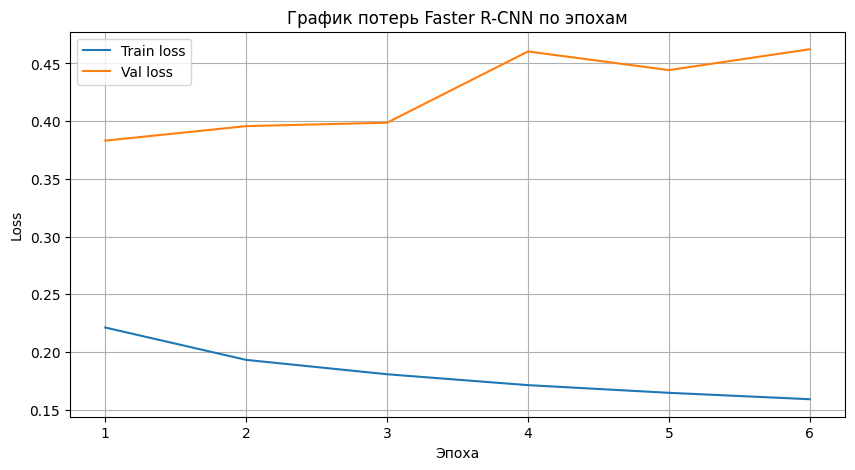

In [68]:
plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Val loss")
plt.xlabel("Эпоха")
plt.ylabel("Loss")
plt.title("График потерь Faster R-CNN по эпохам")
plt.legend()
plt.grid(True)
plt.show()

### Первый запуск с 5 эпохами и patience = 2: Train loss снижается с 0.55 до 0.35, val loss - с 0.5 до 0.4. Оба графика идут вниз без расхождения, что говорит об отсутствии переобучения на 5 эпохах. Модель продолжает улучшаться

### Далее при выборе 15 эпох, началось переобучение, поэтому графики перестали идти равномерно вниз


## Загружаем лучшие веса модели, сохранённые в процессе обучения

В ходе обучения на 6 эпохах val_loss достиг минимума на эпохе 1
(val_loss = 0.383), после чего начал расти - признак переобучения.
Early stopping остановил обучение на эпохе 6.

Благодаря сохранению лучших весов во время обучения мы можем вернуться к состоянию модели с минимальным val_loss, не используя переобученную версию. Именно эти веса будут использоваться для
оценки mAP и генерации финального видео.

In [67]:
model.load_state_dict(torch.load(best_model_path, map_location=device))
model = model.to(device)
print("Загружены лучшие веса, val_loss = 0.3831")

Загружены лучшие веса, val_loss = 0.3831


## Считаем mAP на валидационной выборке

In [69]:
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import torch

model.eval()
metric = MeanAveragePrecision(iou_type="bbox")

with torch.no_grad():
    for images, targets in tqdm(val_loader, desc="Считаем mAP"):
        images = [img.to(device) for img in images]
        outputs = model(images)

        preds = []
        for out in outputs:
            preds.append({
                "boxes": out["boxes"].cpu(),
                "scores": out["scores"].cpu(),
                "labels": out["labels"].cpu(),
            })

        gts = []
        for t in targets:
            gts.append({
                "boxes": t["boxes"].cpu(),
                "labels": t["labels"].cpu(),
            })

        metric.update(preds, gts)

map_result = metric.compute()
print(f"mAP@0.5:      {map_result['map_50']:.4f}")
print(f"mAP@0.5:0.95: {map_result['map']:.4f}")
print(f"mAR@100:      {map_result['mar_100']:.4f}")

Считаем mAP: 100%|██████████| 30/30 [00:11<00:00,  2.71it/s]


mAP@0.5:      0.9032
mAP@0.5:0.95: 0.7769
mAR@100:      0.8242


### Модель Faster R-CNN достигла mAP@0.5 = 0.9 на валидационной выборке, что является высоким результатом для детекции транспортных средств
### mAP@0.5:0.95 = 0.78 показывает, что модель хорошо локализует объекты даже при более строгих порогах IoU - большинство bbox точно совпадают с разметкой

### mAR@100 = 0.82 означает, что модель восстанавливает около 82% всех объектов на изображении



## Визуализируем предсказания модели на валидационных кадрах

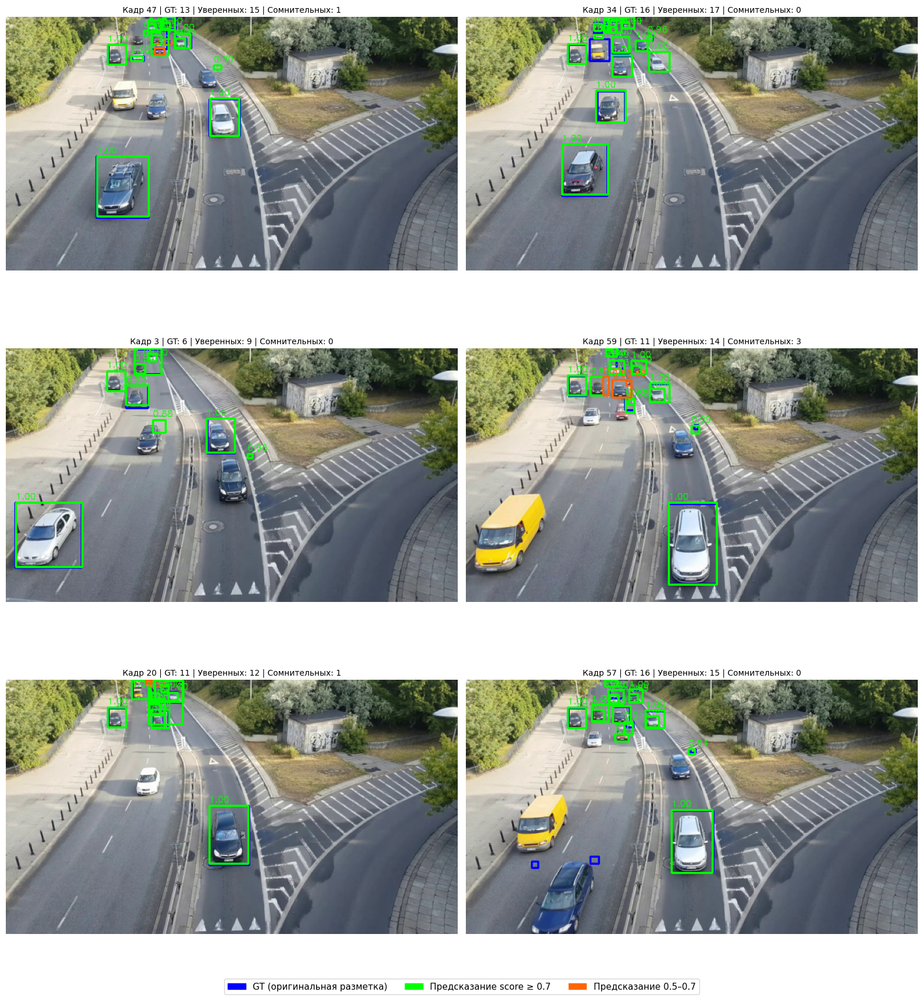

In [70]:
import random

SCORE_THRESHOLD = 0.5

model.eval()

sample_indices = random.sample(range(len(val_dataset)), 6)

fig, axes = plt.subplots(3, 2, figsize=(16, 18))
axes = axes.flatten()

with torch.no_grad():
    for plot_idx, dataset_idx in enumerate(sample_indices):
        image_tensor, target = val_dataset[dataset_idx]
        image_for_model = image_tensor.unsqueeze(0).to(device)
        output = model(image_for_model)[0]

        image_np = (image_tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8).copy()

        for box in target["boxes"]:
            x1, y1, x2, y2 = box.int().tolist()
            cv2.rectangle(image_np, (x1, y1), (x2, y2), (0, 0, 255), 2)

        pred_boxes = output["boxes"].cpu()
        pred_scores = output["scores"].cpu()

        tp_count = 0
        fp_count = 0

        for box, score in zip(pred_boxes, pred_scores):
            if score < SCORE_THRESHOLD:
                continue
            x1, y1, x2, y2 = box.int().tolist()
            color = (0, 255, 0) if score >= 0.7 else (255, 100, 0)
            cv2.rectangle(image_np, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image_np, f"{score:.2f}", (x1, max(y1 - 5, 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)
            if score >= 0.7:
                tp_count += 1
            else:
                fp_count += 1

        gt_count = len(target["boxes"])
        axes[plot_idx].imshow(image_np)
        axes[plot_idx].set_title(
            f"Кадр {dataset_idx} | GT: {gt_count} | "
            f"Уверенных: {tp_count} | Сомнительных: {fp_count}",
            fontsize=10
        )
        axes[plot_idx].axis("off")

from matplotlib.patches import Patch
legend = [
    Patch(color=(0, 0, 1), label="GT (оригинальная разметка)"),
    Patch(color=(0, 1, 0), label="Предсказание score ≥ 0.7"),
    Patch(color=(1, 0.4, 0), label="Предсказание 0.5–0.7"),
]
fig.legend(handles=legend, loc="lower center", ncol=3, fontsize=11)
plt.tight_layout()
plt.show()

### Вывод: Визуализация предсказаний модели на 6 случайных валидационных кадрах

### Успешные случаи: модель уверенно (score ≥ 0.7) находит крупные и средние легковые автомобили на открытой дороге — кадры 3 и 20 показывают почти полное покрытие объектов зелёными bbox.

### Проблемные случаи:
- Минивэн (на кадрах 57 и 59) - модель полностью пропускает. Причина: сильный дисбаланс классов в датасете (car: 9419 vs minivan: 240), из-за чего модель не успела выучить признаки минивэнов.
- Мелкие объекты вдали (верхняя часть кадров) - пропуски или низкий score 0.5–0.7 (оранжевые bbox).
- Скопления близко стоящих машин - несколько ложных срабатываний из-за наложения объектов друг на друга.


## Создаём финальное видео с предсказаниями модели

In [73]:
import cv2
import torch
import numpy as np
from tqdm import tqdm

SCORE_THRESHOLD = 0.5
TARGET_SIZE = 640

model.eval()

cap = cv2.VideoCapture(str(INPUT_VIDEO_PATH))
fps = cap.get(cv2.CAP_PROP_FPS)
orig_w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
orig_h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
cap.release()

scale = TARGET_SIZE / max(orig_w, orig_h)
new_w = int(orig_w * scale)
new_h = int(orig_h * scale)

OUTPUT_MODEL_VIDEO_PATH = PROJECT_DIR / "output_model.mp4"
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(str(OUTPUT_MODEL_VIDEO_PATH), fourcc, fps, (new_w, new_h))

cap = cv2.VideoCapture(str(INPUT_VIDEO_PATH))

with torch.no_grad():
    for frame_idx in tqdm(range(frame_count), desc="Рендер видео"):
        ret, frame = cap.read()
        if not ret:
            break

        frame_resized = cv2.resize(frame, (new_w, new_h))
        frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        image_tensor = torch.as_tensor(
            frame_rgb, dtype=torch.float32
        ).permute(2, 0, 1) / 255.0
        image_tensor = image_tensor.unsqueeze(0).to(device)

        output = model(image_tensor)[0]

        boxes = output["boxes"].cpu()
        scores = output["scores"].cpu()

        for box, score in zip(boxes, scores):
            if score < SCORE_THRESHOLD:
                continue
            x1, y1, x2, y2 = box.int().tolist()
            color = (0, 255, 0) if score >= 0.7 else (0, 165, 255)
            cv2.rectangle(frame_resized, (x1, y1), (x2, y2), color, 2)
            cv2.putText(
                frame_resized,
                f"{score:.2f}",
                (x1, max(y1 - 5, 10)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.4, color, 1
            )

        cv2.putText(
            frame_resized,
            f"Frame: {frame_idx}",
            (10, 25),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (255, 255, 255), 2
        )

        out.write(frame_resized)

cap.release()
out.release()
print(f"Видео сохранено: {OUTPUT_MODEL_VIDEO_PATH}")

Рендер видео: 100%|██████████| 301/301 [00:41<00:00,  7.20it/s]

Видео сохранено: /content/output_model.mp4


## Итоги лабораторной работы №3

Извлечение разметки:
Реализованы два метода извлечения bbox через разностную маску. Метод 2
(прямоугольные контуры + NMS) показал лучший результат: precision 0.59,
recall 0.55, mean IoU 0.74

Разметка сохранена в формате COCO

Обучение модели:
Изначально были выбраны 5 эпох для пробного обучения, на них показатели улучшались с каждой последюущей эпохой. После было принято решение сделать 15 эпох, после чего модель начала переобучаться и терять в показателях.

Faster R-CNN на базе ResNet-50 обучена за 5 эпох. Лучший val_loss = 0.383.
На 6 эпохе зафиксировано переобучение (train_loss падает, val_loss растёт),
early stopping сработал корректно. mAP@0.5 = 0.9, mAP@0.5:0.95 = 0.78.




Проблемы в ходе работы:
- Обучение на CPU заняло бы ~1.5 часа на эпоху, решено подключением GPU путём смены среды выполнения на T4
- Оригинальная разметка покрывает 900 кадров, видео только 301
- При конвертации в COCO классы car и minivan слиты в один (vehicle), из-за чего модель не различает их
- Минивэны пропускаются моделью из-за потери информации о классах
- Разностная маска даёт ложные срабатывания на подписи и маркеры bbox исходного размеченного видео